In [12]:
# %%
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy.stats import pearsonr
warnings.simplefilter(action='ignore', category=FutureWarning)

# plt.rcParams['font.family'] = 'Instrument Sans'
plt.rcParams['figure.dpi'] = 500
plt.rcParams['savefig.dpi'] = 500
plt.rcParams['text.usetex'] = False
plt.rcParams['mathtext.fontset'] = "cm"
plt.rcParams.update({'font.size': 15})

In [13]:
# fmri_path='c:/Users/georg/OneDrive/Documents/Documents/fMRI_general'

parcellation='extended_schaefer_200'
ahba_data = pd.read_pickle(f'{parcellation}_expression.pkl')
print(ahba_data)

# fmri_path='c:/Users/georg/OneDrive/Documents/Documents/fMRI_general'

# parcellation='extended_schaefer_200'
# ahba_data = pd.read_pickle(f'{fmri_path}/AHBA_genes/{parcellation}_expression.pkl')
# print('regions, genes =', ahba_data.shape)

gene_symbol      A1BG  A1BG-AS1       A2M     A2ML1   A3GALT2    A4GALT  \
label                                                                     
1            0.390238  0.543343  0.427657  0.495736  0.408085  0.395631   
2            0.281109  0.550849  0.479065  0.379823  0.449241  0.418989   
3            0.291921  0.430407  0.434084  0.433190  0.346480  0.368724   
4            0.280796  0.457784  0.579506  0.437503  0.465322  0.467263   
5            0.418573  0.605499  0.334785  0.408158  0.392339  0.482988   
...               ...       ...       ...       ...       ...       ...   
228          0.620497  0.158666  0.566834  0.651503  0.417862  0.446774   
229          0.730311  0.301256  0.558617  0.569701  0.451283  0.569572   
230          0.733960  0.233076  0.672639  0.619184  0.449774  0.605350   
231          0.718322  0.293831  0.723053  0.617296  0.557638  0.600662   
232          0.704103  0.242652  0.812582  0.633703  0.497524  0.469695   

gene_symbol      AAAS   

In [14]:
"""
~~NOTES~~ (for me, george, to myself)

Choosing SLC17A7 vs SLC17A6 for VGLUT1 vs VGLUT2 ...?

Not including glycine:
- only recep marker is GLRB for beta subunit of GlyR, 
- and SLC6A5 (GlyT2 glycine transporter) is not in AHBA

TPH2 for tryptophan hydroxylase 2 (for serotonin synthesis) is not in AHBA!!!
so have to use SLC6A4 (SER) as proxy :(

Is using CD73 too extracellular as adenosine synthesis marker?

Subsetting opioids based on canonical receptors...

Genes for ionotropic receptors usually mean for a single subunit
- Do we explore the potential combinations of subunits forming functional receptors?
- Or at least, consider alternative subunits as the markers for the same receptor type?

"""

'\n~~NOTES~~ (for me, george, to myself)\n\nChoosing SLC17A7 vs SLC17A6 for VGLUT1 vs VGLUT2 ...?\n\nNot including glycine:\n- only recep marker is GLRB for beta subunit of GlyR, \n- and SLC6A5 (GlyT2 glycine transporter) is not in AHBA\n\nTPH2 for tryptophan hydroxylase 2 (for serotonin synthesis) is not in AHBA!!!\nso have to use SLC6A4 (SER) as proxy :(\n\nIs using CD73 too extracellular as adenosine synthesis marker?\n\nSubsetting opioids based on canonical receptors...\n\nGenes for ionotropic receptors usually mean for a single subunit\n- Do we explore the potential combinations of subunits forming functional receptors?\n- Or at least, consider alternative subunits as the markers for the same receptor type?\n\n'

In [15]:
ligand_receptor_dict = {
    
    ### Glutamate
    'SLC17A7': # VGLUT1 (vesicular glutamate transporter 1)
    
    ['GRIA1', # AMPA (GluA1 subunit)
     'GRIN1', # NMDA (NR1/GluN1 subunit)
     'GRM1', 'GRM2', 'GRM3', 'GRM4', 'GRM5', 'GRM7', 'GRM8', # mGluRs
     ],
    
    ### GABA  
    'GAD1': # GAD67 (Glutamic acid decarboxylase 67 cytosolic enzyme for GABA synthesis)
    
    ['GABRA1', # GABA-A  (alpha1 subunit, often fast-spiking PVALB+, use GABRA2 for dendrite targeting?)
     'GABBR1', # GABA-B
     ],
    
    ### Serotonin
    
    'DDC': # Dopa decarboxylase (5-HTP to 5-HT)
    
    ['HTR1A', # 5-HT1A
    'HTR1E', # 5-HT1E
    'HTR1F', # 5-HT1F
    'HTR2A', # 5-HT2A
    'HTR2C', # 5-HT2C
    'HTR3B', # 5-HT3B
    'HTR3C', # 5-HT3C
    'HTR4',  # 5-HT4
    'HTR5A', # 5-HT5A
    'HTR7',  # 5-HT7
    ],
    
    ### Dopamine
    'TH': # Tyrosine hydroxylase (rate-limiting enzyme for DA synthesis)
    
    ['DRD1', # D1
     'DRD2', # D2
     ],
    
    ### Norepinephrine
    'SLC18A2' : # VMAT2 (vesicular monoamine transporter 2, for NE vesicular packaging)
    
    ['ADRA1A', # alpha1A
     'ADRA1B', # alpha1B
     'ADRA2C', # alpha2C
     'ADRB1',  # beta1
     'ADRB2',  # beta2
     ],

    # Acetylcholine
    'CHAT': # Choline acetyltransferase
    
    ['CHRNA4', # nAChR (alpha4 subunit, use CHRNB2 for beta2 subunit? at a4b2 receptor is target)
     'CHRM1',  # M1
     'CHRM2',  # M2
     'CHRM4',  # M4
    ],

    ### Histamine
    'HDC': # Histidine decarboxylase
    
    ['HRH1', # H1
     'HRH3', # H3
     ],
    
    ### Adenosine
    'NT5E': # CD73 (ecto-5'-nucleotidase, converting AMP to adenosine) ... but is this too extracellular?
    
    ['ADORA1', # A1
     'ADORA2B', # A2B
    ],
    
    ### Endocannabinoids
    'DAGLA': # Diacylglycerol lipase alpha (DAGLÎ±, synthesizing 2-AG)

    ['CNR1', # CB1
     ],

    ### Opioids
    'PENK': # Proenkephalin 
    ['OPRM1', # mu
     ],
    'PDYN': # Prodynorphin
    ['OPRK1', # kappa
     ],

}

# # print combinations
# for ligand, receptors in ligand_receptor_dict.items():
#     for receptor in receptors:
#         print(f'{ligand} -> {receptor}')

In [16]:
receptor_sign_dict = {
    # --- Excitatory (+) ---
    'GRIA1': '+', 'GRIN1': '+',      # Ionotropic Glu
    'GRM1': '+', 'GRM5': '+',        # Gq
    'HTR2A': '+', 'HTR2C': '+',      # Gq
    'HTR3B': '+', 'HTR3C': '+',      # Ionotropic 5-HT
    'HTR4': '+', 'HTR7': '+',        # Gs
    'DRD1': '+',                     # Gs
    'ADRA1A': '+', 'ADRA1B': '+',    # Gq
    'ADRB1': '+', 'ADRB2': '+',      # Gs
    'CHRNA4': '+',                   # Ionotropic nACh
    'CHRM1': '+',                    # Gq
    'HRH1': '+',                     # Gq

    # --- Inhibitory (-) ---
    'GABRA1': '-', 'GABBR1': '-',    # GABA
    'GRM2': '-', 'GRM3': '-',        # Gi from hereon
    'GRM4': '-', 'GRM7': '-', 'GRM8': '-',
    'HTR1A': '-', 'HTR1E': '-', 'HTR1F': '-',
    'HTR5A': '-', 
    'DRD2': '-',
    'ADRA2C': '-',
    'CHRM2': '-', 'CHRM4': '-',
    'HRH3': '-',                     
    'ADORA1': '-',                   
    'CNR1': '-',
    'OPRM1': '-', 'OPRK1': '-', 'OPRL1': '-'
}

receptor_latex_dict = {
    'GRIA1':  r'$AMPA$',
    'GRIN1':  r'$NMDA$',
    'GRM1':   r'$mGluR_1$',
    'GRM2':   r'$mGluR_2$',
    'GRM3':   r'$mGluR_3$',
    'GRM4':   r'$mGluR_4$',
    'GRM5':   r'$mGluR_5$',
    'GRM7':   r'$mGluR_7$',
    'GRM8':   r'$mGluR_8$',
    'GABRA1': r'$GABA_A$',
    'GABBR1': r'$GABA_B$',
    'HTR1A':  r'$5-HT_{1A}$',
    'HTR1E':  r'$5-HT_{1E}$',
    'HTR1F':  r'$5-HT_{1F}$',
    'HTR2A':  r'$5-HT_{2A}$',
    'HTR2C':  r'$5-HT_{2C}$',
    'HTR3B':  r'$5-HT_{3B}$',
    'HTR3C':  r'$5-HT_{3C}$',
    'HTR4':   r'$5-HT_4$',
    'HTR5A':  r'$5-HT_{5A}$',
    'HTR7':   r'$5-HT_7$',
    'DRD1':   r'$D_1$',
    'DRD2':   r'$D_2$',
    'ADRA1A': r'$\alpha_{1A}$',
    'ADRA1B': r'$\alpha_{1B}$',
    'ADRA2C': r'$\alpha_{2C}$',
    'ADRB1':  r'$\beta_1$',
    'ADRB2':  r'$\beta_2$',
    'CHRNA4': r'$nAChR$',
    'CHRM1':  r'$M_1$',
    'CHRM2':  r'$M_2$',
    'CHRM4':  r'$M_4$',
    'HRH1':   r'$H_1$',
    'HRH3':   r'$H_3$',
    'ADORA1': r'$A_1$',
    'ADORA2B':r'$A_{2B}$',
    'CNR1':   r'$CB_1$',
    'OPRM1':  r'$\mu$',
    'OPRK1':  r'$\kappa$',
}

receptor_to_group_dict = {
    'Glutamate':       ['GRIA1', 'GRIN1', 'GRM1', 'GRM2', 'GRM3', 'GRM4', 'GRM5', 'GRM7', 'GRM8'],
    'GABA':            ['GABRA1', 'GABBR1'],
    'Serotonin':       ['HTR1A', 'HTR1E', 'HTR1F', 'HTR2A', 'HTR2C', 'HTR3B', 'HTR3C', 'HTR4', 'HTR5A', 'HTR7'],
    'Dopamine':        ['DRD1', 'DRD2'],
    'Noradrenaline':   ['ADRA1A', 'ADRA1B', 'ADRA2C', 'ADRB1', 'ADRB2'],
    'Acetylcholine':   ['CHRNA4', 'CHRM1', 'CHRM2', 'CHRM4'],
    'Histamine':       ['HRH1', 'HRH3'],
    'Adenosine':       ['ADORA1'],
    'Endocannabinoid': ['CNR1'],
    'Opioid':          ['OPRM1', 'OPRK1', 'OPRL1']
}

In [17]:
# a couple of nework norm options

def minmax_normalisation(data):
    data = np.nan_to_num(data, neginf=0, posinf=0)
    data = (data - data.min()) / (data.max() - data.min())
    return data

def log_minmax_normalisation(data):
    data = np.nan_to_num(np.log(data), neginf=0, posinf=0)
    data = (data - data.min()) / (data.max() - data.min())
    np.fill_diagonal(data, 0.0)
    return np.where(data != 1.0, data, 0.0)

def strength_normalisation(adjacency_matrix):
    """
    Subside the effect of high-strength (or high-degree) nodes.
    https://royalsocietypublishing.org/doi/full/10.1098/rsif.2008.0484
    """
    strength: np.ndarray = adjacency_matrix.sum(1)
    normalized_strength: np.ndarray = np.power(strength, -0.5)
    diagonalized_normalized_strength: np.ndarray = np.diag(normalized_strength)
    normalized_adjacency_matrix: np.ndarray = (
        diagonalized_normalized_strength @ adjacency_matrix @ diagonalized_normalized_strength)
    return normalized_adjacency_matrix

def communicability(adjacency_matrix, alpha=1):
    """
    Computes the communicability of the network, with the option to be scaled by a decay rate factor 'alpha'.
    The alpha factor modulates the decay rate of walks, with smaller values leading
    to quicker subsidence. Alpha should be in the range (0, spectral radius of A).
    Works for binary, weighted, and directed graphs. See [1] for more details.

    Note from Gorka Zamora-lopez on directed graphs: For the adjacency matrix 'A', A_{ij} = 1 indicates j --> i,
    which is the opposite of the conventional graph theory notation. If your adjacency
    matrices follow the graph theory convention, ensure to transpose it first.


    Args:
        adjacency_matrix (np.ndarray): A square and nonnegative matrix representing network's structure.
        alpha (float, optional): The scaling factor. Defaults to 1, meaning that no scaling is applied.
        normalize (bool, optional): If True, applies strength normalization [2] to the matrix. Defaults to False.

    Returns:
        np.ndarray: The (scaled) communicability matrix. Shape: (N, N)

    References:
        [1] https://arxiv.org/abs/2307.02449

        [2] https://royalsocietypublishing.org/doi/full/10.1098/rsif.2008.0484

    """
    from scipy.linalg import expm

    # Check if the user has given a shit about the documentation.
    if adjacency_matrix.shape[1] != adjacency_matrix.shape[0]:
        raise ValueError("The adjacency matrix must be square. Like Spongebob's pants.")

    if np.any(adjacency_matrix < 0.0):
        raise ValueError(
            "The adjacency matrix contains negative values. Unless we figure out some stuff, only nonnegative matrices are allowed."
        )

    adjacency_matrix *= alpha
    communicability_matrix: np.ndarray = expm(adjacency_matrix)

    np.fill_diagonal(communicability_matrix, 0.0)
    return communicability_matrix



Saved 39 lr_matrices to lr_matrices.pkl


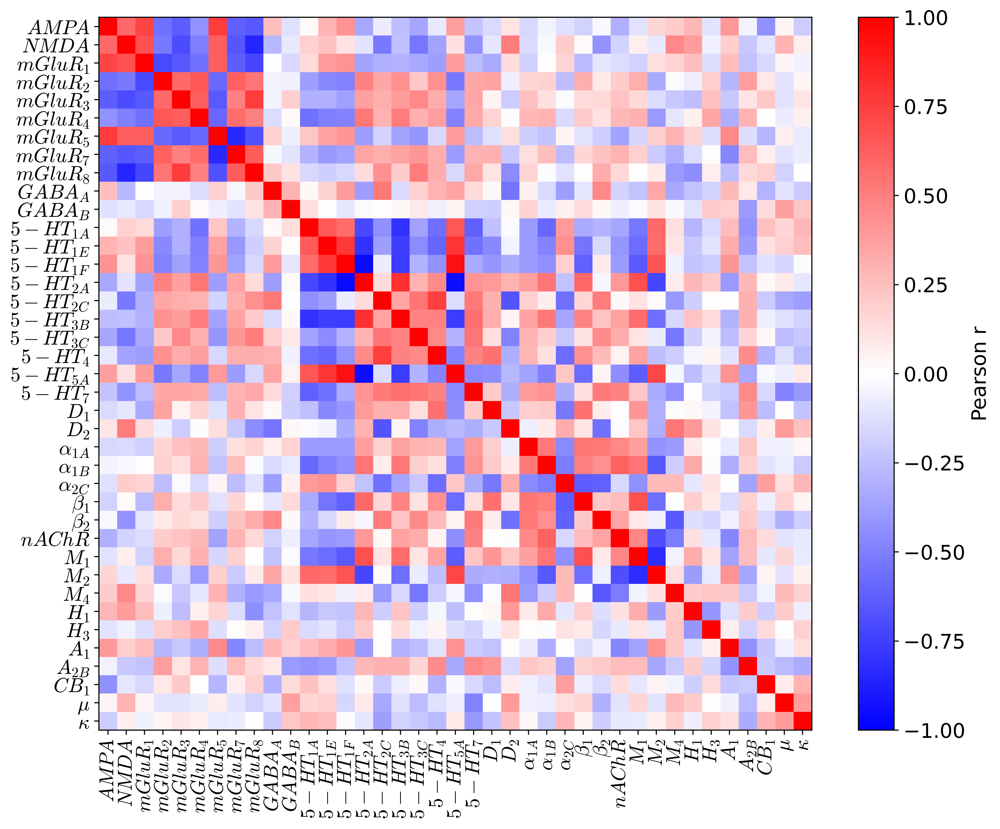

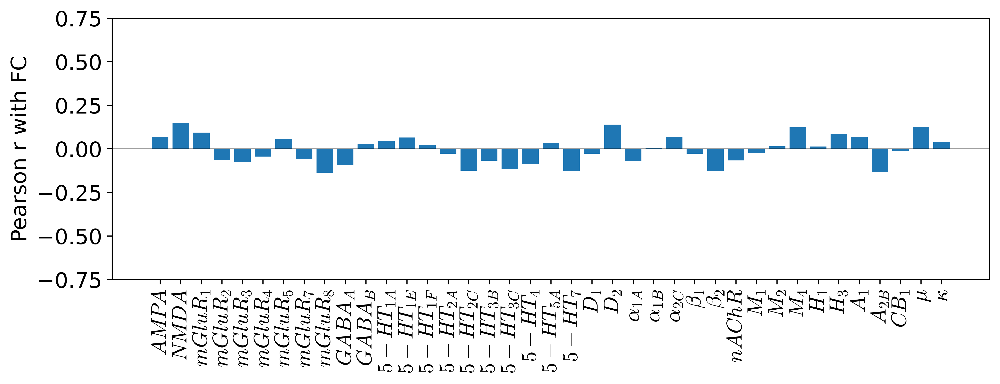

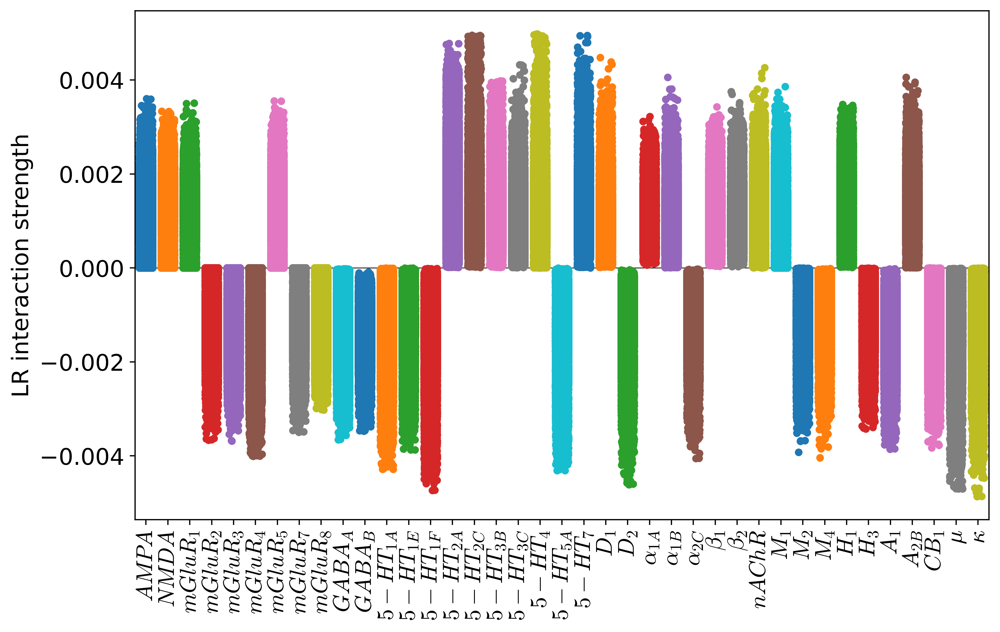

In [19]:
# Make matrices for each LR pair
# M[i, j] = ligand_expr[i] * receptor_expr[j]
# i.e. region i projects the ligand, region j expresses the receptor

lr_matrices = {}  # key: (ligand, receptor), value: (232, 232) ndarray

SC = np.load(f'SC.npy')  # shape (232, 232)
FC = np.load(f'FC.npy')  # shape (232, 232)

from scipy.spatial.distance import cdist
atlas_info = pd.read_csv('extended_schaefer_200.csv')
coords = atlas_info[['x', 'y', 'z']].values  # shape (232, 3)

def idw_fill(vec, coords, power=2, k=10):
    """
    Fill NaNs in a 1D gene expression vector using IDW over MNI coordinates.
    """
    vec = vec.astype(float).copy()
    missing_idx = np.where(np.isnan(vec))[0]
    known_idx   = np.where(~np.isnan(vec))[0]

    if len(missing_idx) == 0 or len(known_idx) == 0:
        return vec

    dist_matrix = cdist(coords, coords)
    np.fill_diagonal(dist_matrix, np.inf)

    for m in missing_idx:
        dists = dist_matrix[m, known_idx]
        nn    = np.argsort(dists)[:k]
        w     = 1.0 / dists[nn] ** power
        vec[m] = np.dot(w, vec[known_idx[nn]]) / w.sum()

    return vec

for ligand, receptors in ligand_receptor_dict.items():
    if ligand not in ahba_data.columns:
        print(f'Ligand not found in AHBA: {ligand}')
        continue
    ligand_vec = ahba_data[ligand].values  # shape (232,)
    ligand_vec = idw_fill(ligand_vec, coords)  # fill NaNs in ligand vector using IDW interpolation
    
    for receptor in receptors:
        if receptor not in ahba_data.columns:
            print(f'Receptor not found in AHBA: {receptor}')
            continue
        receptor_vec = ahba_data[receptor].values  # shape (232,)
        receptor_vec = idw_fill(receptor_vec, coords)  # fill NaNs in receptor vector using IDW interpolation

        # Outer product: M[i,j] = ligand[i] * receptor[j]
        matrix = np.outer(ligand_vec, receptor_vec)

        # use SC as mask
        #matrix *= SC  # element-wise multiplication to apply the mask

        # min max norm
        #matrix = minmax_normalisation(matrix)
        # strength normalisation
        #matrix = strength_normalisation(matrix)
        # communicability
        #matrix = communicability(matrix)
        # threshold by top 90% of edges
        #threshold = np.percentile(matrix, 90)
        #matrix = np.where(matrix >= threshold, matrix, 0)

        # make values negative if in inhibitory receptor
        if receptor_sign_dict.get(receptor, '+') == '-':
            matrix *= -1

        lr_matrices[receptor] = matrix / 200 # scale down


import pickle

with open('lr_ matrices.pkl', 'wb') as f:
    pickle.dump(lr_matrices, f)

print(f"Saved {len(lr_matrices)} lr_matrices to lr_matrices.pkl")

# correlation with eachother
receptors = list(lr_matrices.keys())
stacked = np.array([lr_matrices[r].flatten() for r in receptors])
corr_matrix = np.corrcoef(stacked)

plt.figure(figsize=(10*1.1, 8*1.1))
plt.imshow(corr_matrix, cmap='bwr', vmin=-1, vmax=1)
plt.xticks(ticks=np.arange(len(receptors)), labels=[receptor_latex_dict[r] for r in receptors], rotation=90)
plt.yticks(ticks=np.arange(len(receptors)), labels=[receptor_latex_dict[r] for r in receptors])
plt.colorbar(label='Pearson r')
plt.tight_layout()

# correlate them with FC
FC_flat = FC.flatten()
lr_fc_corrs = {}
for receptor, matrix in lr_matrices.items():
    r, p = pearsonr(matrix.flatten(), FC_flat)
    lr_fc_corrs[receptor] = r

receptors = list(lr_fc_corrs.keys())
corrs = [lr_fc_corrs[r] for r in receptors]
plt.figure(figsize=(10, 4))
plt.bar(range(len(receptors)), corrs)
plt.xticks(range(len(receptors)), [receptor_latex_dict[r] for r in receptors], rotation=90)
plt.ylabel('Pearson r with FC')
plt.axhline(0, color='k', linewidth=0.5)
plt.ylim(-0.75, 0.75)
plt.tight_layout()
plt.show()

# plot distributions of values in the matrices
plt.figure(figsize=(10, 6))
for receptor, matrix in lr_matrices.items():
    values = matrix.flatten()
    sns.stripplot(x=[receptor_latex_dict[receptor]]*len(values), y=values, jitter=0.3)
plt.xticks(rotation=90)
plt.ylabel('LR interaction strength')
plt.axhline(0, color='k', linewidth=0.5)

In [21]:
import pickle

with open('lr_matrices.pkl', 'wb') as f:
    pickle.dump(lr_matrices, f)

print(f"Saved {len(lr_matrices)} lr_matrices to lr_matrices.pkl")

Saved 39 lr_matrices to lr_matrices.pkl


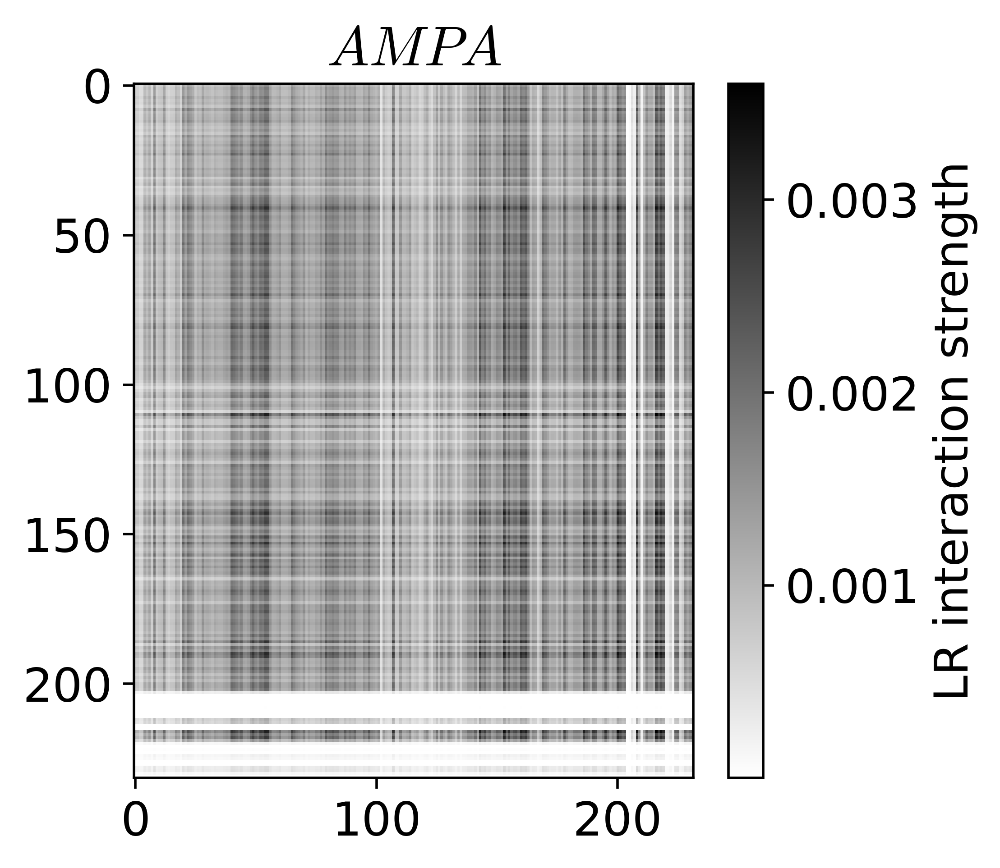

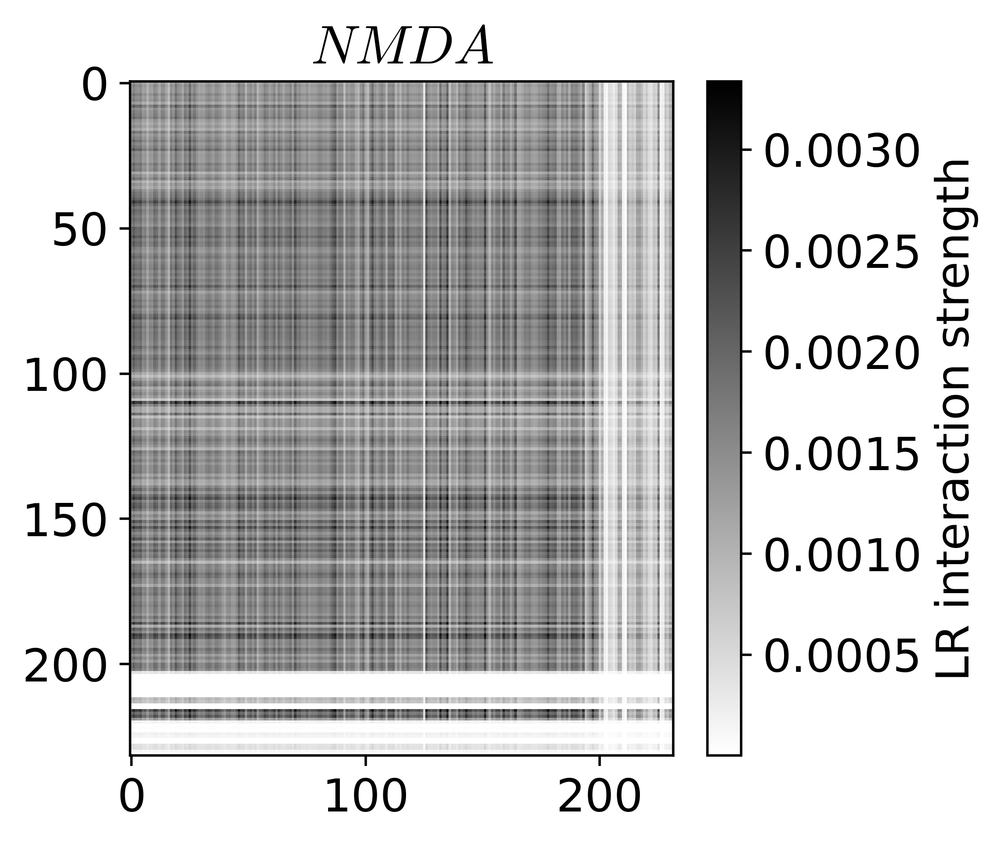

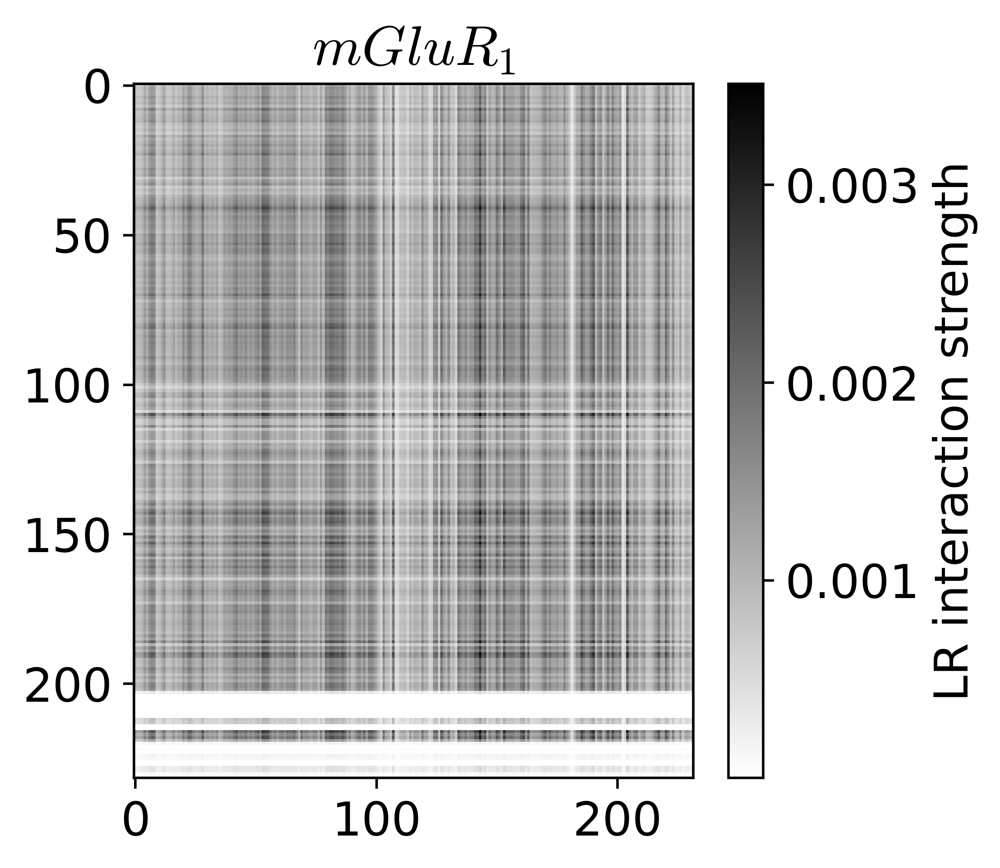

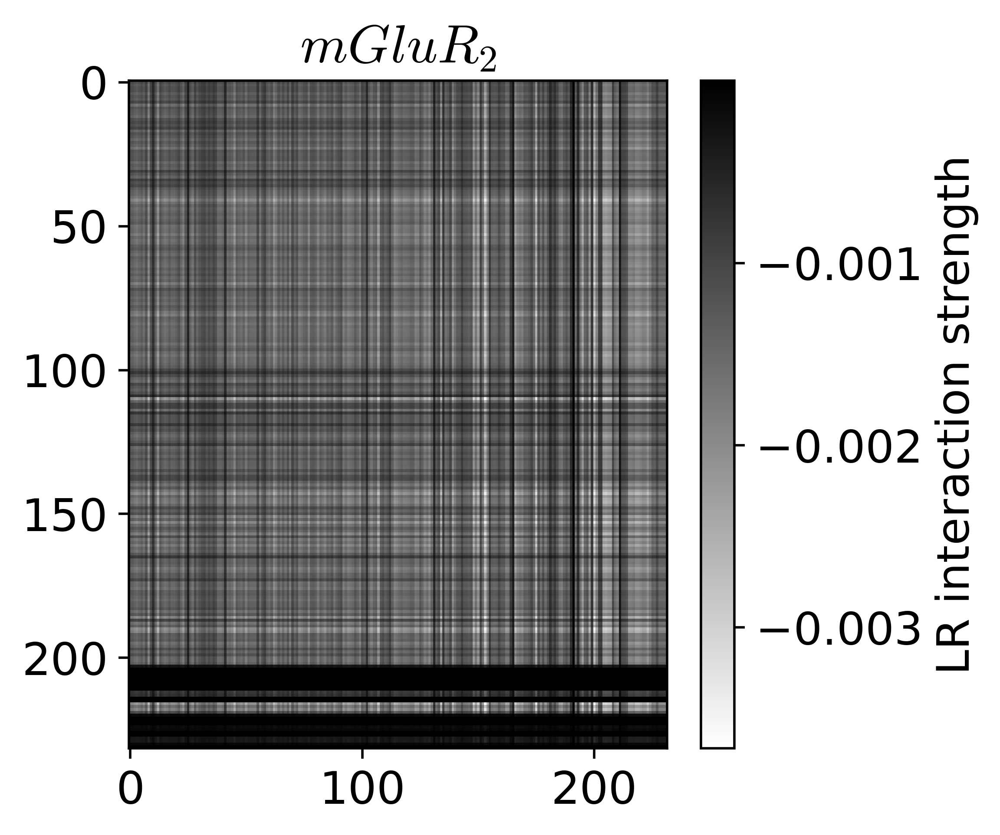

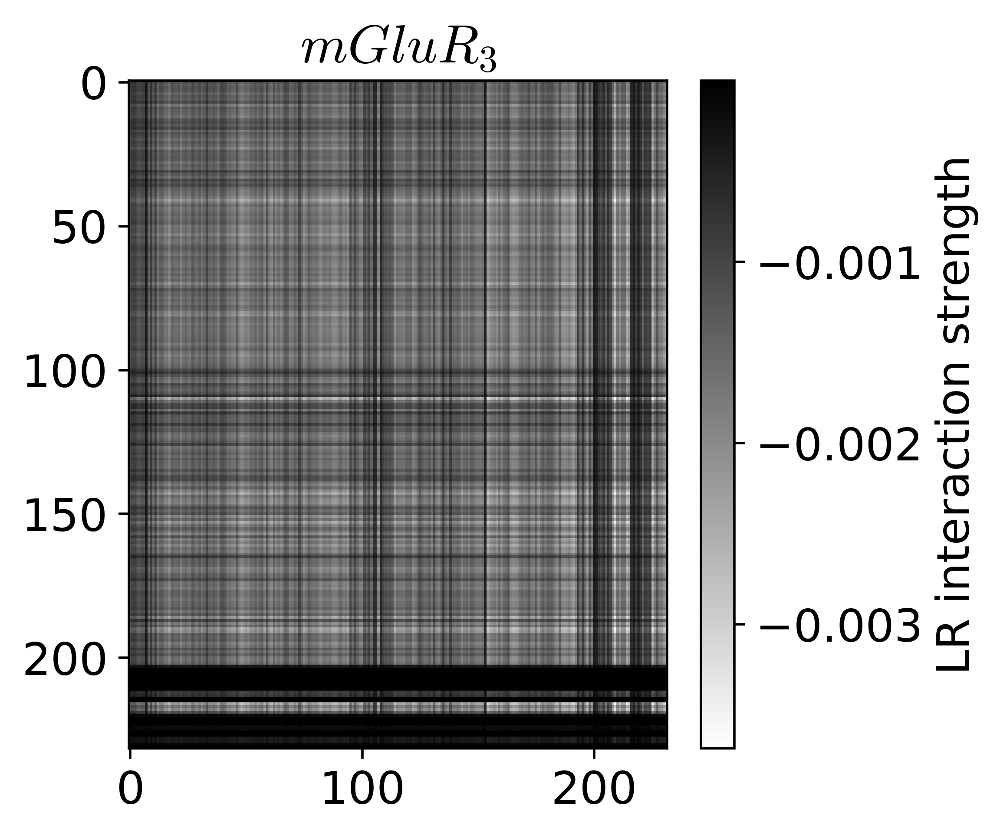

...

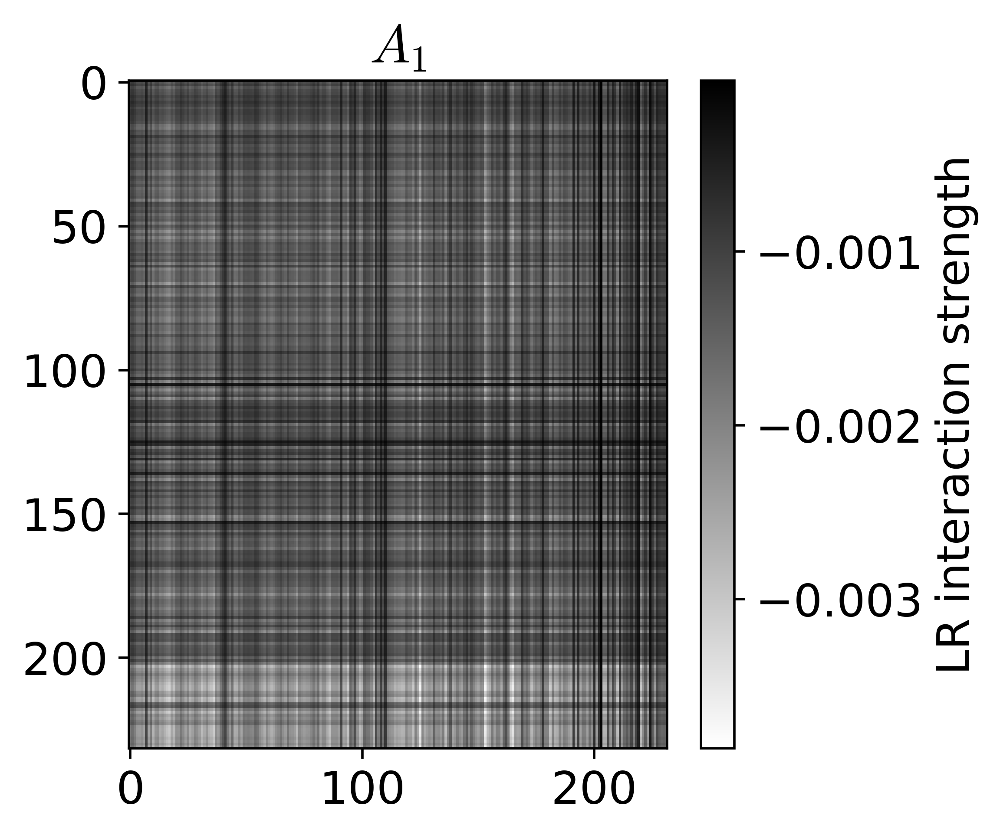

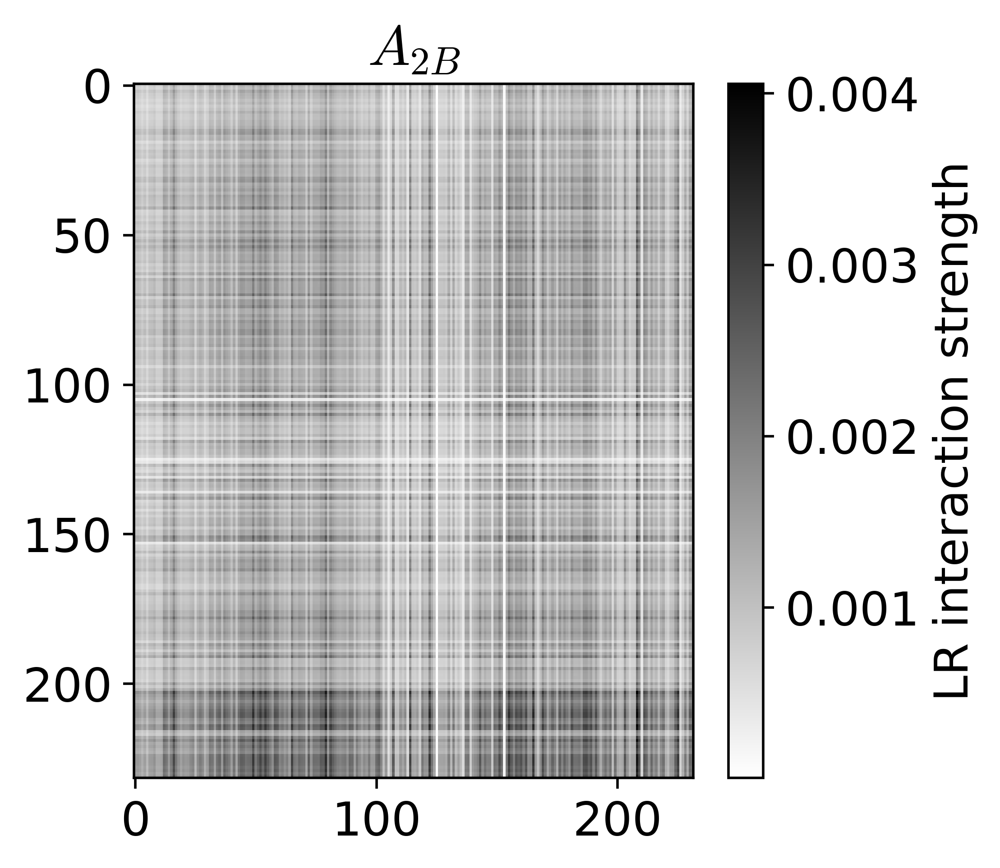

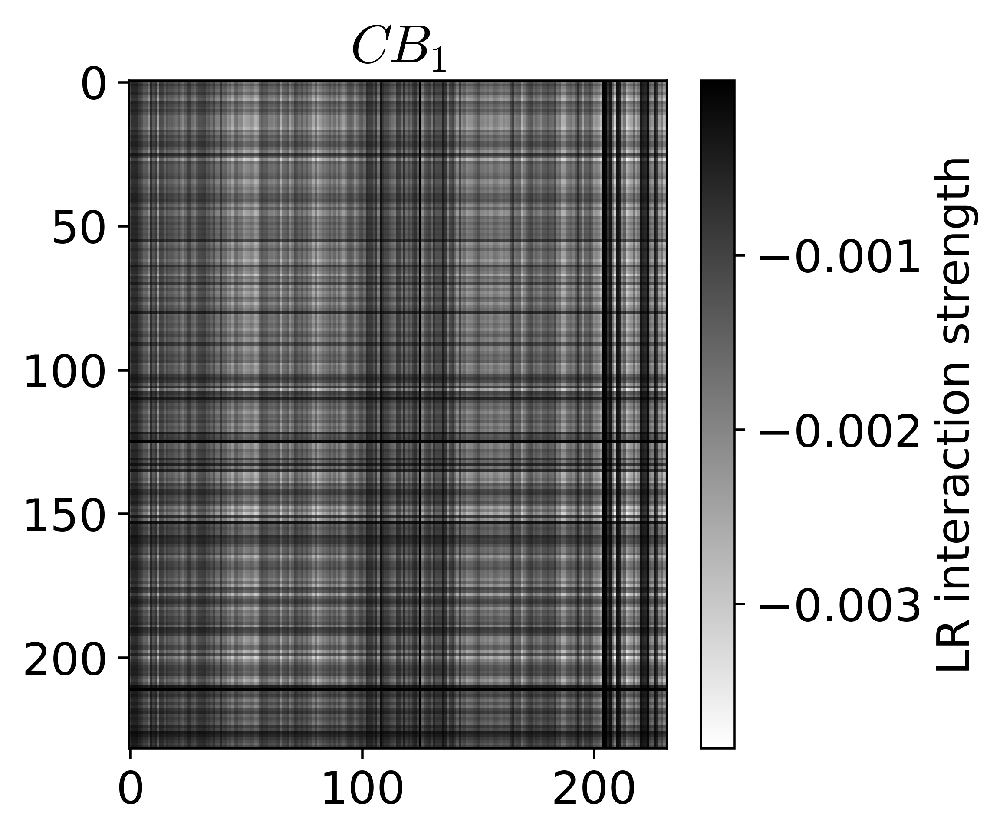

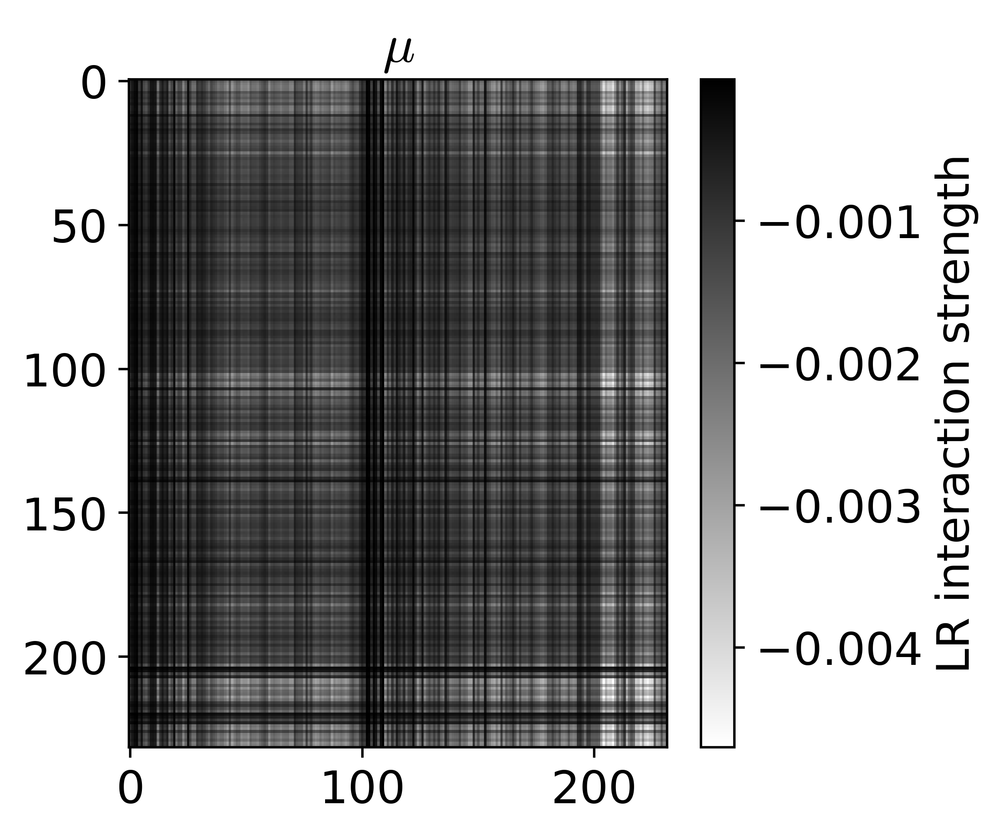

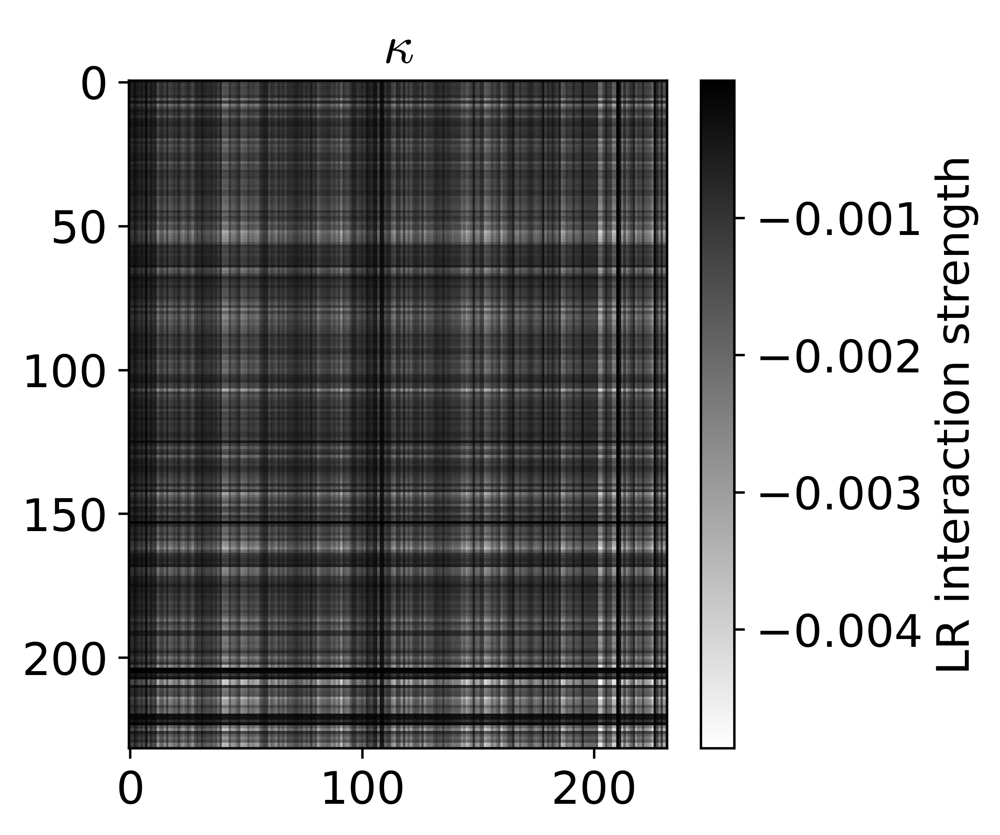

In [22]:
for (receptor, matrix) in lr_matrices.items():
    plt.figure(figsize=(4, 4))
    plt.imshow(matrix, aspect='auto', cmap='binary')
    plt.title(fr'{receptor_latex_dict[receptor]}')
    # add a colorbar
    plt.colorbar(label='LR interaction strength')
    plt.show()